<a href="https://colab.research.google.com/github/ThuyHaLE/ThuyHaLE/blob/main/Web_Crawling_Using_Selenium.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#1. Import necessary libraries

In [ ]:
%%shell
# Ubuntu no longer distributes chromium-browser outside of snap
#
# Proposed solution: https://askubuntu.com/questions/1204571/how-to-install-chromium-without-snap

# Add debian buster
cat > /etc/apt/sources.list.d/debian.list <<'EOF'
deb [arch=amd64 signed-by=/usr/share/keyrings/debian-buster.gpg] http://deb.debian.org/debian buster main
deb [arch=amd64 signed-by=/usr/share/keyrings/debian-buster-updates.gpg] http://deb.debian.org/debian buster-updates main
deb [arch=amd64 signed-by=/usr/share/keyrings/debian-security-buster.gpg] http://deb.debian.org/debian-security buster/updates main
EOF

# Add keys
apt-key adv --keyserver keyserver.ubuntu.com --recv-keys DCC9EFBF77E11517
apt-key adv --keyserver keyserver.ubuntu.com --recv-keys 648ACFD622F3D138
apt-key adv --keyserver keyserver.ubuntu.com --recv-keys 112695A0E562B32A

apt-key export 77E11517 | gpg --dearmour -o /usr/share/keyrings/debian-buster.gpg
apt-key export 22F3D138 | gpg --dearmour -o /usr/share/keyrings/debian-buster-updates.gpg
apt-key export E562B32A | gpg --dearmour -o /usr/share/keyrings/debian-security-buster.gpg

# Prefer debian repo for chromium* packages only
# Note the double-blank lines between entries
cat > /etc/apt/preferences.d/chromium.pref << 'EOF'
Package: *
Pin: release a=eoan
Pin-Priority: 500


Package: *
Pin: origin "deb.debian.org"
Pin-Priority: 300


Package: chromium*
Pin: origin "deb.debian.org"
Pin-Priority: 700
EOF

Executing: /tmp/apt-key-gpghome.qDeXDNp1Du/gpg.1.sh --keyserver keyserver.ubuntu.com --recv-keys DCC9EFBF77E11517
gpg: key DCC9EFBF77E11517: public key "Debian Stable Release Key (10/buster) <debian-release@lists.debian.org>" imported
gpg: Total number processed: 1
gpg:               imported: 1
Executing: /tmp/apt-key-gpghome.hXU0WnOcTk/gpg.1.sh --keyserver keyserver.ubuntu.com --recv-keys 648ACFD622F3D138
gpg: key DC30D7C23CBBABEE: public key "Debian Archive Automatic Signing Key (10/buster) <ftpmaster@debian.org>" imported
gpg: Total number processed: 1
gpg:               imported: 1
Executing: /tmp/apt-key-gpghome.xzI9gtPf5o/gpg.1.sh --keyserver keyserver.ubuntu.com --recv-keys 112695A0E562B32A
gpg: key 4DFAB270CAA96DFA: public key "Debian Security Archive Automatic Signing Key (10/buster) <ftpmaster@debian.org>" imported
gpg: Total number processed: 1
gpg:               imported: 1


In [ ]:
# Install chromium and chromium-driver
!apt-get update
!apt-get install chromium chromium-driver

Get:1 http://deb.debian.org/debian buster InRelease [122 kB]
Get:2 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Hit:3 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal InRelease
Get:4 http://deb.debian.org/debian buster-updates InRelease [56.6 kB]
Hit:5 http://archive.ubuntu.com/ubuntu focal InRelease
Get:6 http://deb.debian.org/debian-security buster/updates InRelease [34.8 kB]
Get:7 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease [3,622 B]
Get:8 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]
Hit:9 http://ppa.launchpad.net/cran/libgit2/ubuntu focal InRelease
Hit:10 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu focal InRelease
Hit:11 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease
Get:12 http://archive.ubuntu.com/ubuntu focal-backports InRelease [108 kB]
Hit:13 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu focal InRelease
Hit:14 http://ppa.launchpad.net/ubuntugis/ppa/ub

In [ ]:
# Install selenium
!pip install selenium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 92.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 384.9/384.9 kB 48.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 6.7 MB/s eta 0:00:00


In [ ]:
# Install webdriver_manager
!pip install webdriver_manager

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
import os
import requests
import time
import random

from io import BytesIO
from tqdm import tqdm

#2. Crawling
######**社会ニュース一覧**: https://www3.nhk.or.jp/news/cat01.html

##Import necessary libraries

In [ ]:
#Import Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from selenium import webdriver

from selenium.webdriver.chrome.options import Options
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.common.by import By

from selenium.common.exceptions import TimeoutException

from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support.expected_conditions import staleness_of

from webdriver_manager.chrome import ChromeDriverManager

#Open a chrome as web browser
service = Service(executable_path=r'/usr/bin/chromedriver')
options = webdriver.ChromeOptions()
options.add_argument('--headless')
options.add_argument('--no-sandbox')
options.add_argument('--disable-dev-shm-usage')
driver = webdriver.Chrome(service=service, options=options)

In [ ]:
# Create a folder for storing articles
root_dir = '/content/drive/MyDrive/2023-Projects/Crawling/NHK' 
os.makedirs(root_dir, exist_ok=True)

# Prepare needed xpaths for crawling (please note that it depends on the HTML structure of the webpage)
xpath_time = '//*[@id="main"]/article/section/header/div/p/time' #get time of a article
xpath_title = '//*[@id="main"]/article/section/header/div/h1/span' #get title of a article
xpath_summary = '//*[@id="main"]/article/section/section/div/p' #get summary of a article

##Crawling title, time, and details of the articles

In [ ]:
#Crawling title, time, and details of the articles
# Create a folder for storing articles
ttd_root_dir = '/content/drive/MyDrive/2023-Projects/Crawling/NHK/title_time_details' 
os.makedirs(ttd_root_dir, exist_ok=True)

%cd '/content/drive/MyDrive/2023-Projects/Crawling/NHK/title_time_details' 

n_pages =  200 # Change if you want more articles
article_id = 0

page_idx = n_pages//20 #this site only shows 20 articles/page
main_url = f'https://www3.nhk.or.jp/news/cat01.html#!/{page_idx}/' 
driver.get(main_url) #access main url

# Get list of articles (list of URLs)
news_page_urls = []
for i in range(1,n_pages+1):
  news_lst_xpath = f'//*[@id="main"]/article/section/div/ul/li[{i}]/dl/dd/a' #this xpath allows we can get a list of 20 article links
  news_tags = driver.find_elements(By.XPATH, news_lst_xpath)
  news_page_urls.append([
      news_tag.get_attribute('href') \
          for news_tag in news_tags
  ][0])

for url in news_page_urls: #After we have a list of links, we will use a loop to access and scrawl text in each article.
  driver.get(url)
  time.sleep(1) #avoid being recognized as a BOT
  c_time = [
      paragraphs_tag.text.strip() \
      for paragraphs_tag in driver.find_elements(By.XPATH, xpath_time)][0] #time
  c_title = [
      paragraphs_tag.text.strip() \
      for paragraphs_tag in driver.find_elements(By.XPATH, xpath_title)][0] #tile
  c_summary = [
      paragraphs_tag.text.strip() \
      for paragraphs_tag in driver.find_elements(By.XPATH, xpath_summary)][0] #summary
  c_mdetails = [
      paragraphs_tag.text.strip() \
      for paragraphs_tag in driver.find_elements(By.CLASS_NAME, "content--detail-body")][0] #all details

  #synthesize information
  final_content_lst = [c_title, c_time, c_mdetails]
  final_content = '\n\n'.join(final_content_lst)

  # Save artile to .txt file
  article_filename = f'article_{article_id:05d}.txt'
  article_savepath = os.path.join(ttd_root_dir,
                                        article_filename)
  article_id += 1
  
  with open(article_savepath, 'w') as f:
    f.write(final_content)
    f.close()

##Crawling title and summary of the articles

In [ ]:
#Crawling title and summary of the articles

ts_root_dir = '/content/drive/MyDrive/2023-Projects/Crawling/NHK/title_and_summary' 
os.makedirs(ts_root_dir, exist_ok=True)

%cd '/content/drive/MyDrive/2023-Projects/Crawling/NHK/title_and_summary'

n_pages =  200 
article_id_v1 = 0

page_idx = n_pages//20
main_url = f'https://www3.nhk.or.jp/news/cat01.html#!/{page_idx}/' 
driver.get(main_url)

news_page_urls = []
for i in range(1,n_pages+1):
  news_lst_xpath = f'//*[@id="main"]/article/section/div/ul/li[{i}]/dl/dd/a'
  news_tags = driver.find_elements(By.XPATH, news_lst_xpath)
  news_page_urls.append([
      news_tag.get_attribute('href') \
          for news_tag in news_tags
  ][0])

for url in news_page_urls:
  driver.get(url)
  time.sleep(1)
  c_time = [
      paragraphs_tag.text.strip() \
      for paragraphs_tag in driver.find_elements(By.XPATH, xpath_time)][0]
  c_title = [
      paragraphs_tag.text.strip() \
      for paragraphs_tag in driver.find_elements(By.XPATH, xpath_title)][0]
  c_summary = [
      paragraphs_tag.text.strip() \
      for paragraphs_tag in driver.find_elements(By.XPATH, xpath_summary)][0]
  c_mdetails = [
      paragraphs_tag.text.strip() \
      for paragraphs_tag in driver.find_elements(By.CLASS_NAME, "content--detail-body")][0]
  

  final_content_lst_v1 = [c_title, c_summary]
  final_content_v1 = '\n\n'.join(final_content_lst_v1)

  article_filename_v1 = f'article_v1{article_id_v1:05d}.txt'
  article_savepath_v1 = os.path.join(ts_root_dir,
                                        article_filename_v1)
  article_id_v1 += 1
  
  with open(article_filename_v1, 'w') as f:
    f.write(final_content_v1)
    f.close()

/content/drive/MyDrive/2023-Projects/Crawling/NHK/title_and_summary


#WordCloud

##Import necessary libraries

In [ ]:
#Install wordcloud
!pip3 install wordcloud==1.8.1
#Import package and its set of stopwords
from wordcloud import WordCloud, STOPWORDS
print ('Wordcloud is installed and imported!')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 220.7/220.7 kB 11.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for wordcloud: filename=wordcloud-1.8.1-cp310-cp310-linux_x86_64.whl size=441144 sha256=53ae1ef822de80d3007b4fa5fb8a51ecd19c3f2dd5ca8fd49d1a70c4f04a65be
  Stored in directory: /root/.cache/pip/wheels/6b/b1/75/024072f28a2b9d6c4f80b35ebfd6ced7fd9fc58e9f1b933b9f
Successfully built wordcloud
  Attempting uninstall: wordcloud
    Found existing installation: wordcloud 1.8.2.2
    Uninstalling wordcloud-1.8.2.2:
      Successfully uninstalled wordcloud-1.8.2.2
Wordcloud is installed and imported!


In [40]:
#Import some library
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import urllib
import urllib.request
from PIL import Image

##WordClound using title, time, details of the articles

In [ ]:
dir_list = os.listdir('/content/drive/MyDrive/2023-Projects/Crawling/NHK/title_time_details') #list files in the directory

#merge all articles into a text file
os.chdir('/content/drive/MyDrive/2023-Projects/Crawling/NHK/title_time_details') 
filenames = dir_list[1:]
with open('title_time_details.txt', 'w') as outfile:
    for fname in filenames:
        with open(fname) as infile:
            for line in infile:
                outfile.write(line)

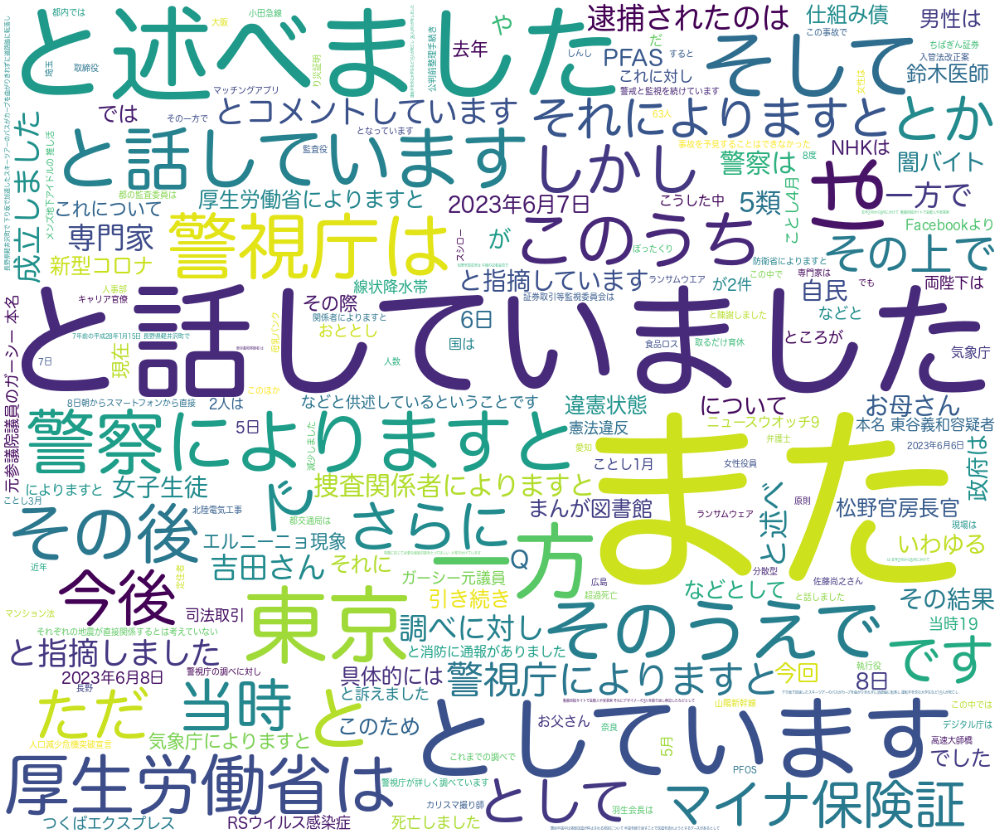

In [ ]:
#Use text file to create a wordcloud
news = open ("/content/drive/MyDrive/2023-Projects/Crawling/NHK/title_time_details/title_time_details.txt").read().replace('\n\n','').replace('\n','')

wordcloud = WordCloud(font_path = '/content/drive/MyDrive/Data science/Mine/Word Clouds-Belle/ヒラギノ丸ゴ ProN W4.ttc',
                      max_words=len(news),
                      stopwords=STOPWORDS,
                      background_color = 'white',
                      width=1200,
                      height=1000
                      ).generate(news)

#Show the image
fig = plt.figure(figsize=(50, 50))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

##WordClound using title and summary of the articles

In [ ]:
import os
dir_list = os.listdir('/content/drive/MyDrive/2023-Projects/Crawling/NHK/title_and_summary')
os.chdir('/content/drive/MyDrive/2023-Projects/Crawling/NHK/title_and_summary')
filenames = dir_list[1:]
with open('title_and_summary.txt', 'w') as outfile:
    for fname in filenames:
        with open(fname) as infile:
            for line in infile:
                outfile.write(line)

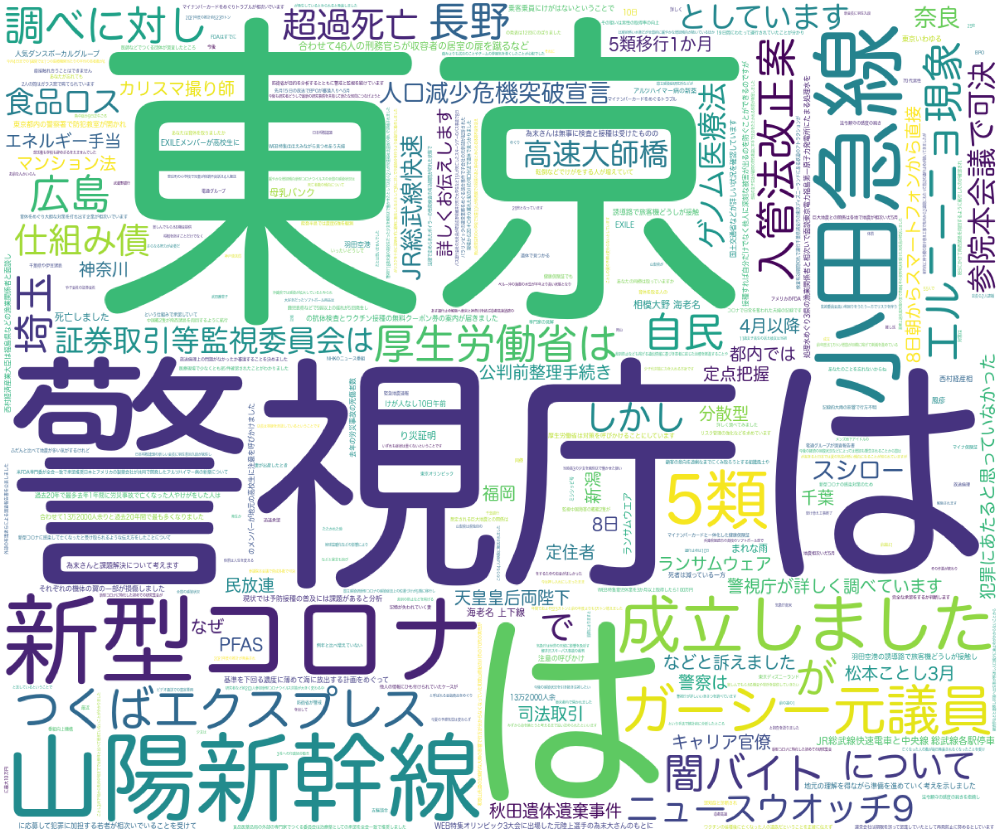

In [ ]:
news = open ("/content/drive/MyDrive/2023-Projects/Crawling/NHK/title_and_summary/title_and_summary.txt").read().replace('\n\n','').replace('\n','')

wordcloud = WordCloud(font_path = '/content/drive/MyDrive/Data science/Mine/Word Clouds-Belle/ヒラギノ丸ゴ ProN W4.ttc',
                      max_words=len(news),
                      stopwords=STOPWORDS,
                      background_color = 'white',
                      width=1200,
                      height=1000
                      ).generate(news)

fig = plt.figure(figsize=(50, 50))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()